In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim
from unet import UNet
from loss_fns import *
import lpips
import scipy
from unet_v2 import *

In [6]:
# complete model
device = torch.device('cuda:0')

model_amp = UNet2(num_input_channels=32, num_layers_to_concat = 8, upsample_mode='bilinear', 
             pad='zero', norm_layer=nn.BatchNorm2d, need_sigmoid=True, need_bias=True).to(device)
model_phase = UNet2(num_input_channels=64, num_layers_to_concat = 8, upsample_mode='bilinear', 
             pad='zero', norm_layer=nn.BatchNorm2d, need_sigmoid=True, need_bias=True).to(device)

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T


# coeffs = torch.rand(10, 1, requires_grad=True)
# coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
coeffs = torch.tensor([[ -13.53], [-113.3250], [ -12.7425], [   4.4154], [   6.2158], 
                       [ -119.261], [   2.3329], [  1.3617], [   1.5364], [  3.5796]])
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True).to(device)
data = torch.rand(1, 64, 1024, 1360).float().to(device)
# data = scipy.ndimage.filters.gaussian_filter(data, 20)
# data = torch.tensor(data)
# data = data.clone().detach().repeat(32, 1, 1).unsqueeze(0).float().to(device)

# obj_phase = torch.rand(1024, 1360, requires_grad=True).to(device)

phase_img = np.load('phase_0.npy')
abs_img = np.load('abs_0.npy')

target_phase = torch.tensor(phase_img).T.to(device)
target_abs = torch.tensor(abs_img).T.to(device)

cons = torch.tensor(3.2, requires_grad=True)
# dist = torch.tensor(155.003, requires_grad=True) # mm 

# loss_fn_alex = lpips.LPIPS(net='alex') 

optimizer = optim.Adam([
    # {'params': obj_phase, 'lr': 1e-1},
    # {'params': obj_amp, 'lr': 1e-1},
    {'params': coeffs, 'lr': 1e-1},
    {'params': cons, 'lr': 1e-2}
    # {'params': dist, 'lr': 1}
    ],
    lr=0.01, betas=(0.9, 0.999)
    )
optimizer_proc = optim.Adam([
    {'params': model_amp.parameters(), 'lr': 1e-3},
    {'params': model_phase.parameters(), 'lr': 1e-3}],
    lr=0.01, betas=(0.9, 0.999)
    )

scheduler = optim.lr_scheduler.StepLR(optimizer_proc, step_size=300, gamma=0.5)

wave_obj = Wave2d(
        numPx = list(phase_img.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

In [7]:
data.shape

torch.Size([1, 64, 1024, 1360])

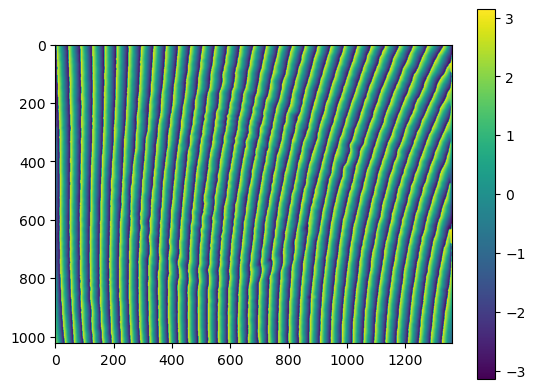

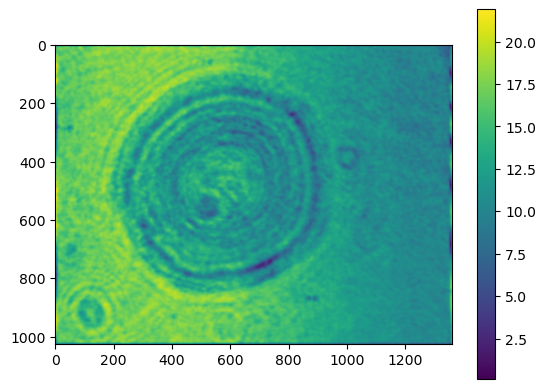

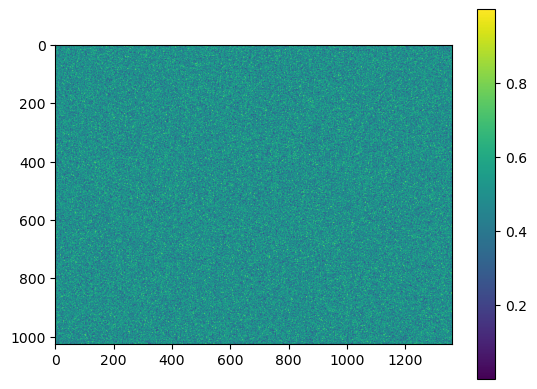

In [8]:
plt.imshow(target_phase.T.cpu())
plt.colorbar()
plt.show()

plt.imshow(target_abs.T.cpu())
plt.colorbar()
plt.show()

plt.imshow(data[0, 1, :, :].cpu().detach())
plt.colorbar()
plt.show()

In [8]:
np.array([np.arange(2), [2, 4]])

array([[0, 1],
       [2, 4]])

0 0.8417071933170963


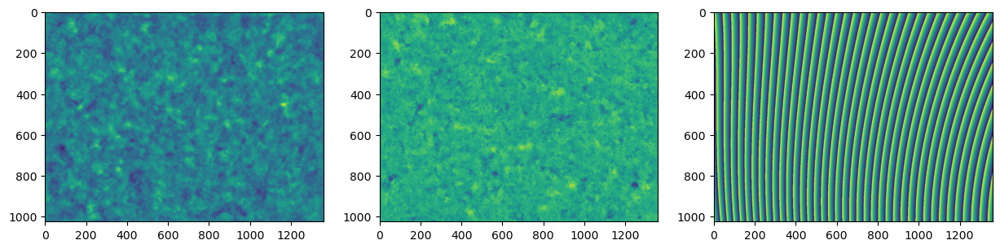

1 0.410418461665751
2 0.25716109622721156
3 0.23334537096055802
4 0.22118749976463808
5 0.21398809165653787
6 0.20912528094121144
7 0.2057607300980721
8 0.20314566000473203
9 0.20104665951928968
10 0.19920660884480162
11 0.19754691773444966
12 0.19610763562006067
13 0.19478406664374623
14 0.19355940157663296
15 0.19246319414104693
16 0.191421817829719
17 0.19045084338585755
18 0.18955543913480083
19 0.18868747113604423
20 0.18786199006269447
21 0.18708948507711767
22 0.18635358466755275
23 0.18564351448579589
24 0.1849638117128572
25 0.18429723585067115
26 0.18364712649448894
27 0.1830166765270523
28 0.1823976124286456
29 0.18178420057774844
30 0.1811851272503616
31 0.18059986904517333
32 0.18001884250627329
33 0.17943829000220357
34 0.17886358926441837
35 0.17829577668934948
36 0.17773303516265143
37 0.17717089117449442
38 0.17661325719303592
39 0.17607006673643769
40 0.17553844434010243
41 0.17500953705970457
42 0.17448727009996753
43 0.1739793190312638
44 0.17347161889898116
45 0.17

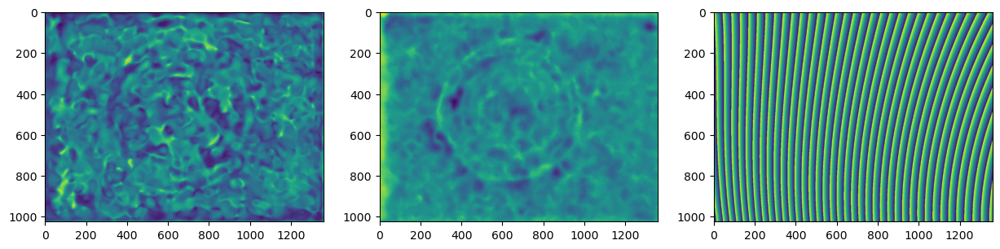

51 0.16999139384697456
52 0.16952288493444193
53 0.1690310274864528
54 0.16860258878324852
55 0.16810681248054793
56 0.16757568812017526
57 0.16723567453523008
58 0.1666541998407347
59 0.1661554959633948
60 0.16581690231270088
61 0.1651698177609724
62 0.16471188796128516
63 0.16413868047535496
64 0.16352023650055514
65 0.16293043450801697
66 0.16231050187995158
67 0.16163470944265884
68 0.1609884742105614
69 0.16059033161997965
70 0.15994916297919257
71 0.15937436035432725
72 0.1589195841913032
73 0.15839266401906135
74 0.15862620217602905
75 0.1584276262244996
76 0.15737572987654339
77 0.15630821026819133
78 0.15575612827772897
79 0.15535658503606992
80 0.1546094362595784
81 0.15386990354067479
82 0.15284582607753347
83 0.15248388803666635
84 0.15191709350672714
85 0.1514803785424993
86 0.1513058237593167
87 0.15099164337830628
88 0.15016293509340675
89 0.14860451123251664
90 0.14798793256881929
91 0.1475134090086341
92 0.14708469460043552
93 0.14623688102173715
94 0.1454279448036853


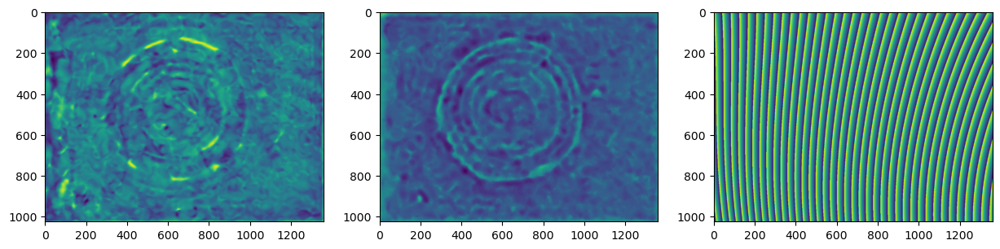

101 0.14094316783393024
102 0.14112139538321242
103 0.14040522591680055
104 0.1388673421387802
105 0.13813761642817426
106 0.13793644044934955
107 0.13715336193782096
108 0.13640258514278045
109 0.1359448773598864
110 0.1350297752458242
111 0.13454094786177356
112 0.13490847213994192
113 0.13540131405789774
114 0.1342034473748148
115 0.13189391677836668
116 0.13139182229671414
117 0.1316640777912894
118 0.1315122391011345
119 0.1303933089081667
120 0.12956464719153843
121 0.12856296461866257
122 0.12795866153542593
123 0.12729338541839005
124 0.12722725344336733
125 0.12761624986948117
126 0.12792504449396347
127 0.12712673390832366
128 0.12494804062586082
129 0.12453728736175498
130 0.12454410000264454
131 0.12453906668928627
132 0.12509658691018977
133 0.12452749092908638
134 0.1249638587011113
135 0.12312698894215889
136 0.12218887498073404
137 0.12286398275895685
138 0.12200763585539494
139 0.12112742937554886
140 0.1203764058805009
141 0.12027880278261029
142 0.12009240366473986
1

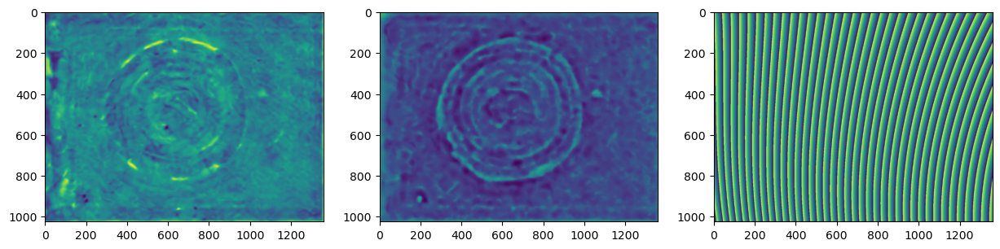

151 0.1169267015333734
152 0.11584316939214699
153 0.11632531567016353
154 0.11713356111215219
155 0.11788248150589586
156 0.11793677301108191
157 0.11528409532066727
158 0.11492874646409697
159 0.11499181894494692
160 0.11458778417866824
161 0.1139424595591898
162 0.11316441839430266
163 0.11301854334889322
164 0.1118138926010015
165 0.11186195235419369
166 0.11238070133937703
167 0.114353466289147
168 0.11289041670000091
169 0.11289235671142081
170 0.111450368465593
171 0.1122527561369106
172 0.11241857181365297
173 0.11323341985590193
174 0.11372750398084808
175 0.11156207094129003
176 0.11113945140045522
177 0.10978432825109337
178 0.10896374498557673
179 0.11041365717523328
180 0.10989518580877596
181 0.10835207118277944
182 0.10746622328431905
183 0.10749625399657892
184 0.10738471904080713
185 0.107447200025554
186 0.10824386230525027
187 0.11278731206459305
188 0.11114950427266344
189 0.1083597627658733
190 0.10766471745821585
191 0.1090000500486149
192 0.10758291821508459
193 

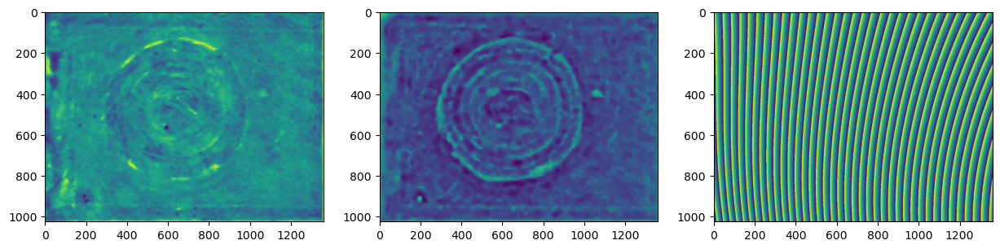

201 0.10491606399011692
202 0.10494750271405048
203 0.10452458510428386
204 0.10454066459505858
205 0.1048181177818909
206 0.10475103983762027
207 0.1038087134187194
208 0.10327275462112953
209 0.10320480915432666
210 0.10372024699721977
211 0.10355236953750277
212 0.10261399738286092
213 0.103054026965235
214 0.10378709048516882
215 0.10372880907340122
216 0.1018421557980131
217 0.10153323144969334
218 0.10164661498963366
219 0.10124103347854753
220 0.10042367822927661
221 0.10095372996481389
222 0.10174148774174042
223 0.10122145643681524
224 0.10002614964449766
225 0.10036034596716759
226 0.10048081776874038
227 0.10147332441405967
228 0.1026165360778235
229 0.1044976186903824
230 0.1001511620597517
231 0.09978071374575175
232 0.1012378558170294
233 0.10056550403746772
234 0.09995726175466031
235 0.09954218070496872
236 0.09902855474706945
237 0.09780895129028565
238 0.09772172944336383
239 0.0982509692697123
240 0.09929282460827246
241 0.10003566333116162
242 0.10021491658595608
24

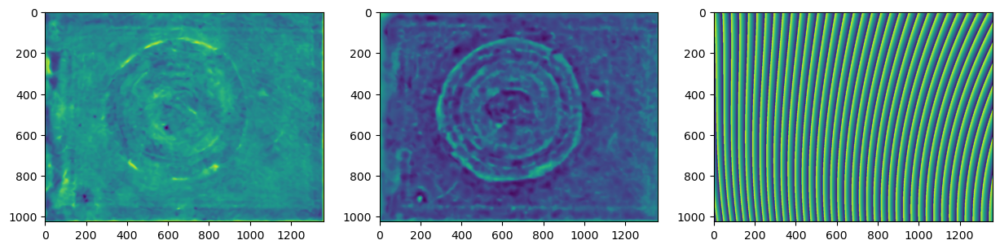

251 0.09869096636644174
252 0.097762156902376
253 0.09966275485457453
254 0.09767858964415135
255 0.09662165487895005
256 0.09649589284465863
257 0.09629861209255894
258 0.09587905111324796
259 0.09546290491347505
260 0.09540957260854169
261 0.09651574034054532
262 0.09864294784531599
263 0.10030421327777646
264 0.09699291433729164
265 0.09689468235497824
266 0.09825500572907231
267 0.09587622319993422
268 0.0948181847072508
269 0.09559216604660774
270 0.09587602855904198
271 0.09511974288824415
272 0.09512989187278756
273 0.09585541912992458
274 0.09596090733032589
275 0.09474176837571233
276 0.09346280143061568
277 0.09275994404350772
278 0.09316055796798531
279 0.09403609299425535
280 0.09418495708836658
281 0.09475602250904579
282 0.09538765611165412
283 0.0945568091959153
284 0.09285303123773685
285 0.09250473853888472
286 0.09349544581747148
287 0.09396516006471944
288 0.09413373798833324
289 0.09371153016529422
290 0.09604576064730957
291 0.09633499212349063
292 0.09579621897550

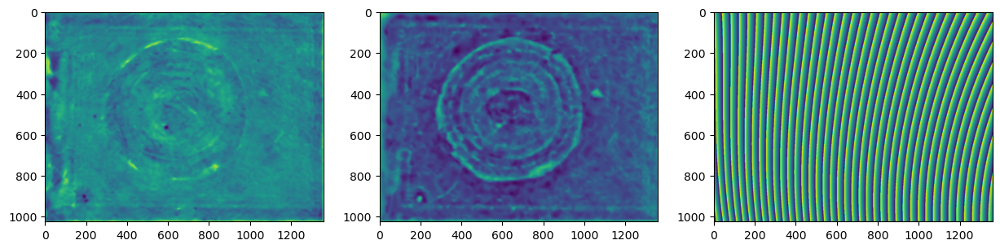

301 0.08903637543792631
302 0.09109406062411678
303 0.08877557814957202
304 0.08992263029897722
305 0.08812729610607302
306 0.08871948096033683
307 0.08765490693305251
308 0.08766468755754078
309 0.08723548265279252
310 0.08681241405313737
311 0.08686011355713412
312 0.0861436960301079
313 0.08624336566641189
314 0.08580736123268326
315 0.0855685709808965
316 0.08545010418886603
317 0.08516240102852927
318 0.08500873218471922
319 0.08478090346954523
320 0.08463431095924888
321 0.08445271802745251
322 0.08424071459717415
323 0.08412418574995806
324 0.08401339030354678
325 0.08380612422523957
326 0.08363067378162443
327 0.0835637999483329
328 0.08347936206327872
329 0.08335305559755668
330 0.08317789375237601
331 0.08301278683747268
332 0.08297019705923878
333 0.08294903798436071
334 0.08285711651017733
335 0.08279012538532796
336 0.08275888683087082
337 0.0828117946418308
338 0.08289887513590505
339 0.08310546168589104
340 0.08323783900364498
341 0.083198475059268
342 0.0828855243218311

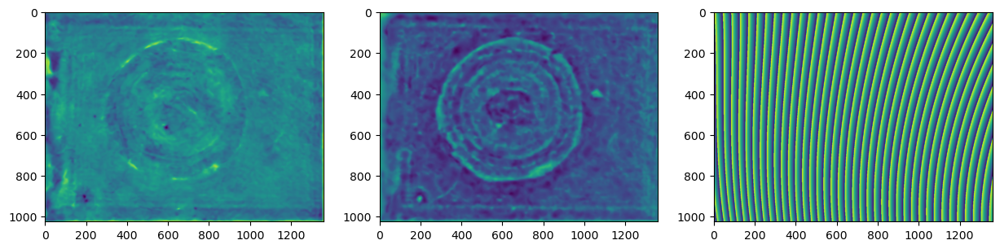

351 0.08263426104112719
352 0.0825795811556573
353 0.08259582551675429
354 0.082644455115571
355 0.08269060945057957
356 0.08246495829898037
357 0.08221219965157579
358 0.08238054340243542
359 0.08247906285506065
360 0.08232258321469425
361 0.08234850686490058
362 0.08230212114263817
363 0.08215226348638788
364 0.08207898419812709
365 0.08198695633607428
366 0.08205426456274426
367 0.0821723269678716
368 0.08208617083097854
369 0.08214012942041199
370 0.08249516340692353
371 0.08265211560377603
372 0.08235928227318459
373 0.08213264845685486
374 0.08167720256077005
375 0.08176605037796346
376 0.0819930680789781
377 0.08185472462870157
378 0.08156780361449215
379 0.08121643356666829
380 0.08139129343399756
381 0.0817830908412055
382 0.08236241030365136
383 0.08273263633999496
384 0.08233349826505154
385 0.08144983343905397
386 0.08141179047524036
387 0.08153595749950177
388 0.08141775039355065
389 0.08140867459996917
390 0.08128066199479587
391 0.0811912183686815
392 0.08089853213143604

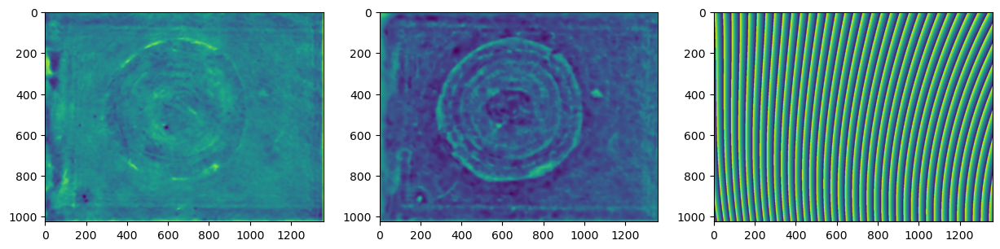

401 0.08091695162058986
402 0.0808089576115032
403 0.08083068679925431
404 0.08087833071886218
405 0.0808504060102613
406 0.08092271411302546
407 0.08086495636637955
408 0.08083418203697651
409 0.08110361861780968
410 0.08100507673733684
411 0.08071272016510317
412 0.08056874147072461
413 0.08029159216761744
414 0.0804477485019166
415 0.08051058357001917
416 0.08064796793722168
417 0.080724643899675
418 0.08058252761869425
419 0.08073913794455945
420 0.08058479732563897
421 0.08052731890495819
422 0.08036502745295264
423 0.08096415199289565
424 0.08079573078362652
425 0.08037912920114743
426 0.07945854937027506
427 0.07960713645089412
428 0.07990457655958569
429 0.08037728046968995
430 0.08102891183176658
431 0.08041108480618551
432 0.08034653877248923
433 0.07944363474228053
434 0.07936014054835291
435 0.07950796971198432
436 0.08007935995105539
437 0.08040235033704175
438 0.08032916654579264
439 0.08085495476041593
440 0.08085844688728533
441 0.08036131433164256
442 0.080000489079822

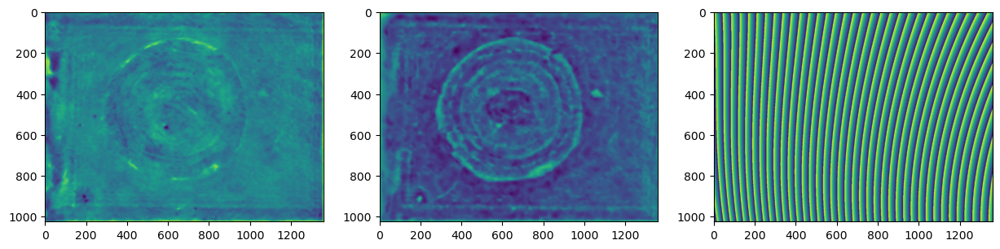

451 0.0792643828426056
452 0.07910913581986506
453 0.07896196735383264
454 0.07924580236781475
455 0.07930311912879691
456 0.07953833244941666
457 0.07943796860136804
458 0.0789619189037632
459 0.07905539678579838
460 0.07919217894710656
461 0.07995580754089572
462 0.08064283014433789
463 0.08009345697742583
464 0.07891491021148406
465 0.07819989027323221
466 0.07834650450793898
467 0.07896900947198196
468 0.07913392547270526
469 0.07932344074335969
470 0.07897058107279618
471 0.07910794748508611
472 0.07887900515744825
473 0.07914259968224512
474 0.07886599811805878
475 0.07897725111167304
476 0.07861625448024226
477 0.07860398038910849
478 0.07845447885363115
479 0.07864684248333759
480 0.07853559612407664
481 0.07870926011202642
482 0.07925614116899628
483 0.07942850278933425
484 0.07886967681318707
485 0.07795417489473744
486 0.07754696132126798
487 0.07783754827964522
488 0.07827167783664007
489 0.07864860167798585
490 0.07868532274547424
491 0.07866939030863246
492 0.077966796074

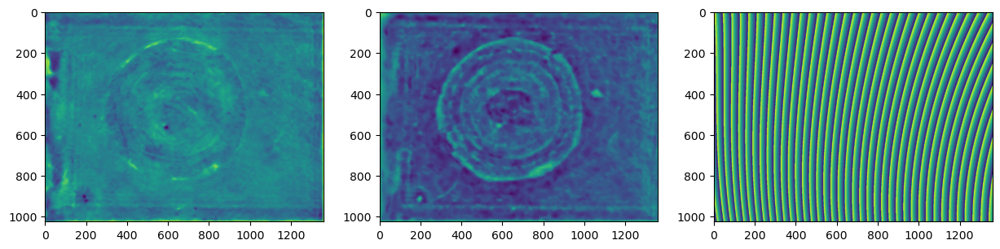

501 0.0775438734598849
502 0.07739783490559463
503 0.07769277603395922
504 0.07761252573249201
505 0.0776264380606892
506 0.07773062729340008
507 0.07815734120734845
508 0.07865152499562282
509 0.07869389345459407
510 0.07815188244028633
511 0.07783022004725784
512 0.07736749626564483
513 0.07781403769116023
514 0.07844574684712312
515 0.07825666884430162
516 0.07780486049735283
517 0.07778956522570786
518 0.07830768152408676
519 0.07790938629655345
520 0.07759773812926873
521 0.07707416017729399
522 0.07696935353683136
523 0.07684406873408137
524 0.07706918022606596
525 0.07702363939467922
526 0.07732218017255724
527 0.07742894640024119
528 0.07718114460566727
529 0.07680877179684636
530 0.07670304735551696
531 0.07676050702448049
532 0.0775816259016428
533 0.07784857323914053
534 0.07813894465668669
535 0.07778536792260873
536 0.07700688886541718
537 0.07633570303931089
538 0.07654057146254688
539 0.07696994894476927
540 0.07753559025236248
541 0.07776125163911622
542 0.0770786964673

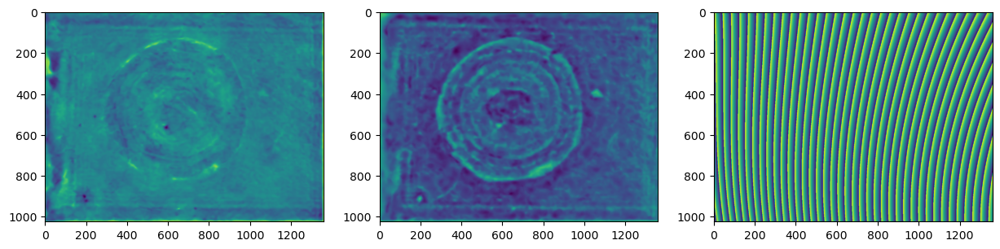

551 0.07680786009056402
552 0.07624221740275873
553 0.07621078066315819
554 0.07635819792955556
555 0.07655414289985493
556 0.07686979612596055
557 0.07698573281456551
558 0.07673920449476307
559 0.07626917345015308
560 0.07602963436022676
561 0.07584282214072488
562 0.0763186749774581
563 0.07713824686680881
564 0.077057881877929
565 0.07739064276085346
566 0.07677777498750415
567 0.07618663587431695
568 0.0760764441965214
569 0.0763682812362843
570 0.07707905418757123
571 0.07649626068363621
572 0.07654069924224424
573 0.07580305955813363
574 0.07591005612160019
575 0.07632435312017369
576 0.07655513023389314
577 0.07643178592103986
578 0.07581386148588254
579 0.07594757163174838
580 0.07625926738800225
581 0.0766953765712084
582 0.07631147347171235
583 0.0757714994515215
584 0.07597953208732305
585 0.0760763591560025
586 0.0765648742891677
587 0.0759164847809151
588 0.07564833144860207
589 0.0752568539533722
590 0.0746986132204106
591 0.07454212056126439
592 0.07501434485719599
593 

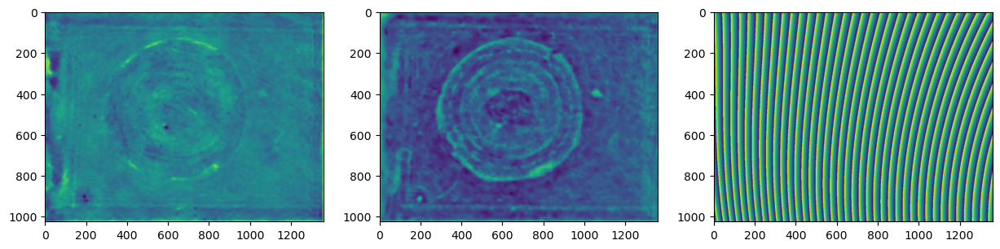

601 0.07278782949943902
602 0.07409283088321955
603 0.07291235986938066
604 0.07352747964108597
605 0.07273132389188629
606 0.07315086410963176
607 0.07254173400800738
608 0.07276946551941821
609 0.07241546180581912
610 0.0724081569141547
611 0.07230027414504325
612 0.07215510623212497
613 0.07219153295320828
614 0.07196920841252688
615 0.07203344749861693
616 0.0718385674522824
617 0.07185508513425451
618 0.07179572292343313
619 0.07171460211857113
620 0.07169054273317875
621 0.07158539930001814
622 0.07157154545882322
623 0.07151622607620285
624 0.0714492304001274
625 0.0714387364665845
626 0.07134214060210534
627 0.07134585341789002
628 0.07128911893210334
629 0.07125142051994116
630 0.07122525791996273
631 0.07119502201261518
632 0.07114387191872465
633 0.07115844289123267
634 0.07110152234807725
635 0.07106947857303603
636 0.07104328583573169
637 0.07100888646663304
638 0.070972750754782
639 0.07097076002827396
640 0.07093317339830467
641 0.07091919262270593
642 0.0708813000695973

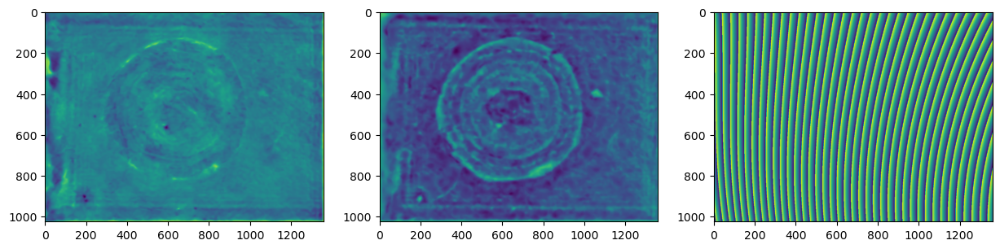

651 0.0706923662866973
652 0.07066620961262417
653 0.07066969577676571
654 0.07064635503465164
655 0.07063399980025137
656 0.0706343483110992
657 0.0705963822301894
658 0.07058444160817688
659 0.07054532292934726
660 0.07053352442055899
661 0.07051174357553525
662 0.07051410519049052
663 0.07050409929303676
664 0.07050324590999699
665 0.07048736059992733
666 0.07048842632509625
667 0.0704838661025276
668 0.0704490543594776
669 0.07044137719696558
670 0.07038111554609507
671 0.07035364059643961
672 0.07034628626331153
673 0.07032495805720118
674 0.07030782005144924
675 0.07032138764905786
676 0.07031276652686796
677 0.07032248735033884
678 0.07038040353424732
679 0.0703812292855579
680 0.07036404058922709
681 0.0703380929113787
682 0.07028750530119565
683 0.07023286182434993
684 0.0702011569898881
685 0.07018496456002979
686 0.07016836481980365
687 0.07017226358561925
688 0.07018644805979081
689 0.07017209539394326
690 0.07021544975714145
691 0.07017434651340079
692 0.07018182592881388


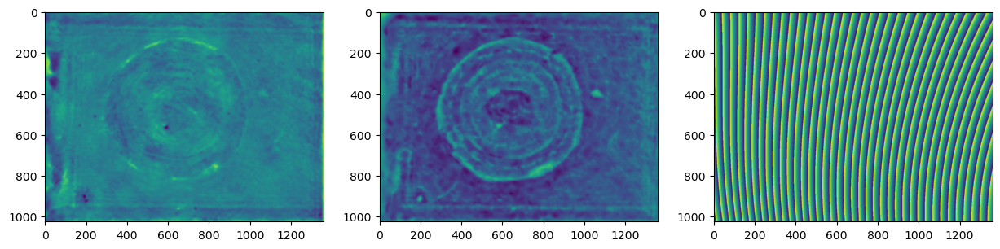

701 0.07009144964024296
702 0.07005263601725922
703 0.07003944616429691
704 0.07002914298911468
705 0.0700828548662254
706 0.07010159764649258
707 0.0702158038944196
708 0.0702085503603121
709 0.07009708153674499
710 0.07000651326879634
711 0.06997614184897613
712 0.06997038230998504
713 0.0699387301086096
714 0.06989991616257477
715 0.06990979369618859
716 0.06995600651247345
717 0.07000112406992365
718 0.07006234658853851
719 0.07007345868513819
720 0.07007533513251167
721 0.07006218167895163
722 0.07004512549842445
723 0.06995124030119794
724 0.06988483672552344
725 0.06985029266897869
726 0.06988839786858125
727 0.06991952697367099
728 0.0699102480528303
729 0.06984899265523346
730 0.06978069783174184
731 0.0698026299161997
732 0.0700033003575864
733 0.07012115429406028
734 0.07007987007408086
735 0.0699437850471884
736 0.06990892145808057
737 0.06991019240503689
738 0.06985750952408223
739 0.06984052887206914
740 0.06984409993768662
741 0.06989764957384371
742 0.0699316924656117
7

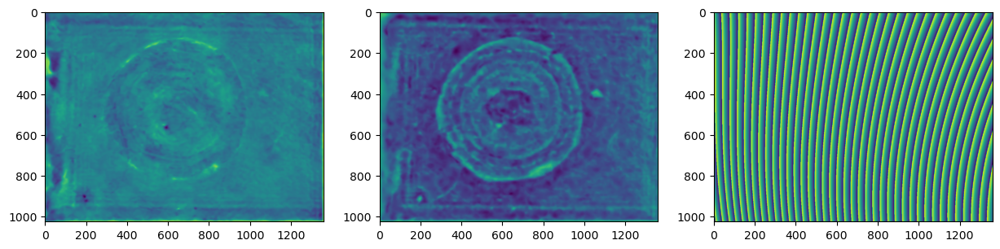

751 0.06964788199208066
752 0.06970932477221481
753 0.06977817068840038
754 0.06973186497936865
755 0.06970058816515708
756 0.06970661768817617
757 0.06968941948839474
758 0.06964146984602612
759 0.0695512835650885
760 0.06949233916881216
761 0.06952956808970608
762 0.06959144212298554
763 0.0695273459494739
764 0.06958216640768111
765 0.06970205671250984
766 0.06976277603927061
767 0.06986480135171311
768 0.06980654728622156
769 0.06970548594763076
770 0.0695385634560711
771 0.06946631510234323
772 0.06939508210952351
773 0.06942456495101312
774 0.06943576236450416
775 0.06949984315809198
776 0.06959433029740288
777 0.06963846598651667
778 0.06956860856775274
779 0.06953781329079349
780 0.06948611107291414
781 0.06935433063186883
782 0.06945606027936156
783 0.06956517402306857
784 0.06978732882157664
785 0.0697507330987342
786 0.0695858239139365
787 0.06943144315785443
788 0.06933930627073218
789 0.06930856098688976
790 0.06922825166345467
791 0.06922846571796863
792 0.069370358856148

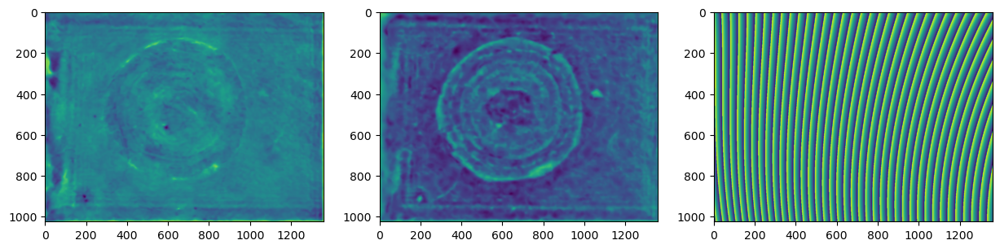

801 0.06931442890927078
802 0.0693387619826352
803 0.06936499010482419
804 0.06941485108750411
805 0.06948795232027684
806 0.06940599537314711
807 0.06941203846008631
808 0.06944216865041439
809 0.06945356550010087
810 0.0694026712381178
811 0.0693357193296936
812 0.06927988588969822
813 0.06927487912066715
814 0.06937491407538315
815 0.06945895665323246
816 0.06941117563823837
817 0.06930918123753717
818 0.06919730104901335
819 0.06921431079359361
820 0.06929333250065034
821 0.0693362194460809
822 0.06938388201947805
823 0.06937393064748992
824 0.06916655044866879
825 0.06925472060619048
826 0.06939536324505444
827 0.06931705976010558
828 0.0692320998205194
829 0.0690458319813447
830 0.06898295633104182
831 0.06908549486633771
832 0.06908927103335112
833 0.06926848806273753
834 0.06947998306963149
835 0.06942694278061719
836 0.06916094344495402
837 0.06907877548398736
838 0.0689231133306971
839 0.06896841499371545
840 0.06891567323387973
841 0.06900434413535428
842 0.06904978524359497

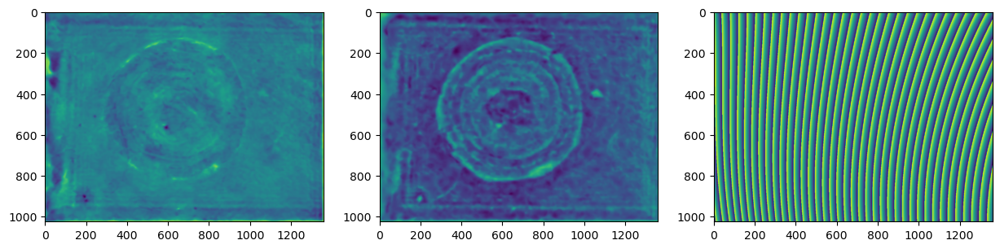

851 0.06903393900671193
852 0.0688009674910054
853 0.06880105587781736
854 0.06891398040546987
855 0.06883144385739944
856 0.06885382475163755
857 0.06886488059714942
858 0.06869673635867918
859 0.06870675775870974
860 0.06890937093661975
861 0.06900130258128187
862 0.0690280515482666
863 0.06901023566464418
864 0.06892399646912317
865 0.06894010489853049
866 0.06887248409913582
867 0.0689814481421421
868 0.06905621021953745
869 0.06899110997393855
870 0.06897496253712533
871 0.06873807015559959
872 0.06864154107860658
873 0.06872240583836789
874 0.06873995219773227
875 0.06864118710034112
876 0.06871337454082292
877 0.06868410400303308
878 0.0686356475971322
879 0.0687130130462888
880 0.06885840705230686
881 0.0689577595704573
882 0.06891560323550755
883 0.06884809354664662
884 0.0687053678403916
885 0.06861032310535753
886 0.06847356094374295
887 0.06836988239231599
888 0.06847160089604079
889 0.06866779403985601
890 0.06885100575250708
891 0.06875170366881111
892 0.06860380162781282

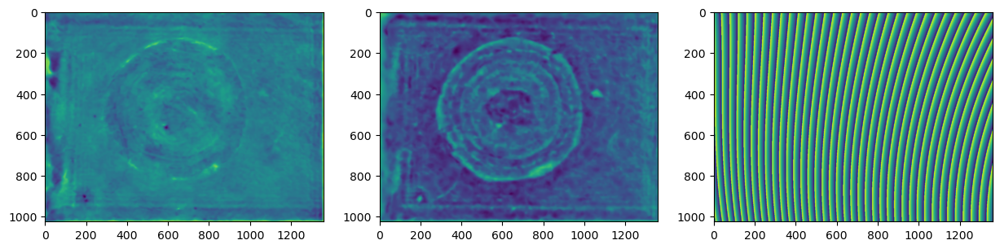

901 0.06740406090875611
902 0.06806561940799294
903 0.06744276562240599
904 0.06781185646385648
905 0.06742927694527616
906 0.06765212800372082
907 0.06736109849255609
908 0.06751909446765793
909 0.06732265173456876
910 0.06741273761093934
911 0.06730804639084073
912 0.06730205328724062
913 0.06724840336548181
914 0.06723068766001583
915 0.06719833811711957
916 0.06716630255800331
917 0.06716166382300906
918 0.06712787149708872
919 0.06710915484266307
920 0.0670937731436426
921 0.0670603899512439
922 0.0670617072042341
923 0.06702444293824397
924 0.06703077403202981
925 0.06699233969137218
926 0.0669961738745369
927 0.06697031605269937
928 0.06695719605331979
929 0.06695088315438621
930 0.06693628017389747
931 0.066927771634967
932 0.06691950543004473
933 0.06690061079329987
934 0.06690765333452448
935 0.06689514793501722
936 0.06687897397623288
937 0.06687238395820543
938 0.06685675993863559
939 0.06685435528992828
940 0.06683603485212361
941 0.06683295609409748
942 0.0668208478588429

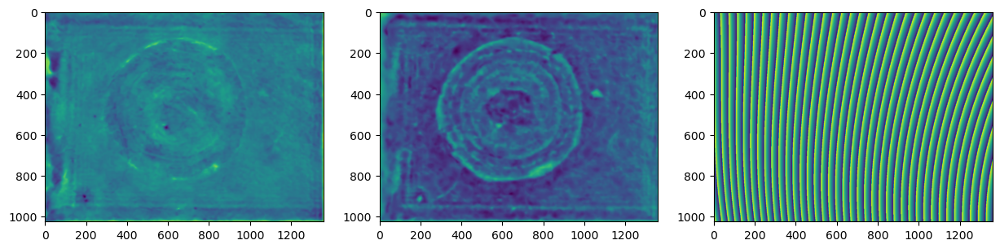

951 0.06674005424856627
952 0.06675264038202293
953 0.06673243984390738
954 0.0667461007289677
955 0.06674140338793588
956 0.06671604545710345
957 0.06671113280125912
958 0.06670781393980048
959 0.06670047268674195
960 0.06669014229143745
961 0.06667245345048783
962 0.06667578928510148
963 0.06666728682698918
964 0.06665313872293291
965 0.06665410679561927
966 0.06663863169867125
967 0.066635502425487
968 0.06663100645083818
969 0.06661223245440039
970 0.06661923063988129
971 0.06660356821104457
972 0.06659727401905982
973 0.06660639048133359
974 0.06659847382425747
975 0.06658036499989803
976 0.0665770447084249
977 0.06659724696620883
978 0.0665769684579564
979 0.06656238549916527
980 0.06657841548399736
981 0.0665704512845584
982 0.06655024735545523
983 0.06654758984591594
984 0.06654140589998916
985 0.06652313266583532
986 0.06653253845241731
987 0.06651426883131858
988 0.06652498052391681
989 0.0665012772800903
990 0.06650690740047778
991 0.06648580389011617
992 0.0664885709274862


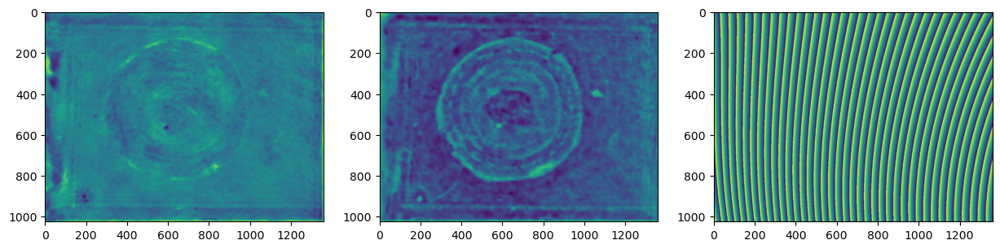

In [9]:
epochs = 1001
loss_arr = []


for itr in range(epochs):

    optimizer.zero_grad()
    optimizer_proc.zero_grad()

    obj_amp = model_amp(data[:, :32, :, :].detach()).squeeze()
    obj_phase = model_phase(data.detach()).squeeze()
    obj = obj_amp*torch.exp(1j*obj_phase)
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)
    wave = torch.exp(1j*wave_phase).to(device)
    
    wave_op = wave*obj
    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(155.003) # mm
    wave_at_img = wave_obj.propogate(dist)

    wave_z_amp = torch.abs(wave_at_img).float().to(device)
    wave_z_phase = torch.angle(wave_at_img).float().to(device) + cons.to(device)

    # print(wave_z_amp.shape, target_abs.shape, obj_amp.shape)

    # wave_z_amp_proc = model_amp(wave_z_amp.unsqueeze(0).unsqueeze(0)).squeeze()
    # wave_z_phase_proc = model_amp(wave_z_phase.unsqueeze(0).unsqueeze(0)).squeeze()

    # loss_proc = 0.9*l2_loss(proc, obj_phase) + total_variation_loss(proc, 0.1)
    
    loss_amp = loss_fn(wave_z_amp, target_abs)
    loss_phase = loss_fn(wave_z_phase, target_phase)
    # loss_amp = l2_loss(torch.abs(wave_at_img).float(), target_abs.float())

    loss = 1*loss_amp + 1*loss_phase
    + total_variation_loss(obj_phase, 0.2) + total_variation_loss(obj_amp, 0.1)
    # + 0.1*l2_loss(wave_z_amp, wave_z_amp_proc) + 0.1*l2_loss(wave_z_phase, wave_z_phase_proc)
    # + 1/(grad_x.ravel().abs().mean() + grad_y.ravel().abs().mean())

    # 

    loss.backward()
    # loss_proc.backward()
    
    optimizer.step()
    optimizer_proc.step()
    scheduler.step()

    loss_arr.append(loss.item())
    print(itr, loss_arr[-1]
        #   , dist.item(), 
        #   (grad_x.ravel().abs().mean() + grad_y.ravel().abs().mean()).abs().item()
          ) 

    if (itr) % 50 == 0:

        fig, axs = plt.subplots(1, 3, figsize=(15, 8))

        axs[0].imshow(obj_phase.cpu().detach())
        # axs[1].imshow(proc.detach())
        axs[1].imshow(obj_amp.cpu().detach())
        axs[2].imshow(torch.angle(wave.cpu().detach()))

        plt.show()

In [6]:
dist, dist.grad, cons.grad, coeffs.grad, coeffs

(tensor(155.0030),
 None,
 tensor(-5.8208e-11),
 tensor([[ 9.0656e-06],
         [-5.9426e-07],
         [ 1.7825e-06],
         [-8.1286e-06],
         [-2.2575e-06],
         [-6.9849e-10],
         [ 8.9228e-06],
         [-2.3991e-06],
         [ 4.7501e-06],
         [-2.2702e-07]]),
 tensor([[ -12.0725],
         [-113.5738],
         [ -14.0559],
         [   5.0558],
         [   5.9724],
         [-119.2851],
         [   2.4568],
         [   0.4720],
         [   0.9534],
         [   3.7933]], requires_grad=True))

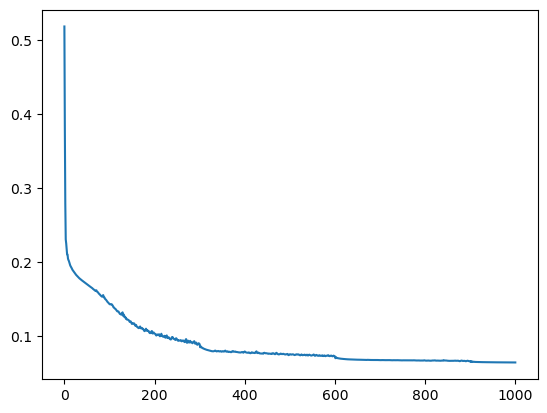

In [26]:
plt.plot(loss_arr)

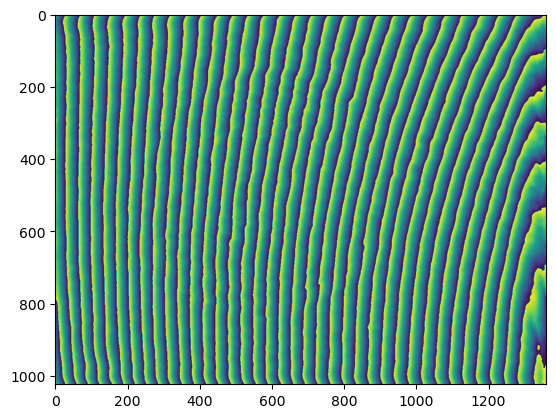

In [27]:
plt.imshow(wave_z_phase.cpu().detach().T)

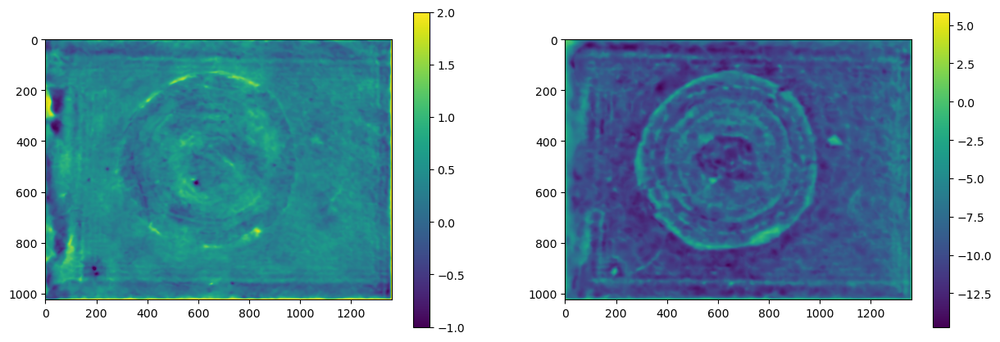

In [13]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.cpu().detach())
cm0 = axs[0].imshow(obj_phase.cpu().detach(), vmin=-1, vmax=2)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

# axs[0].grid()
# axs[1].grid()

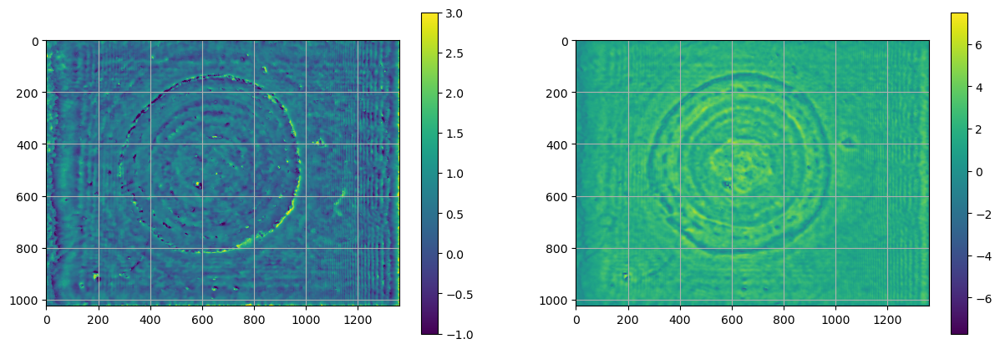

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

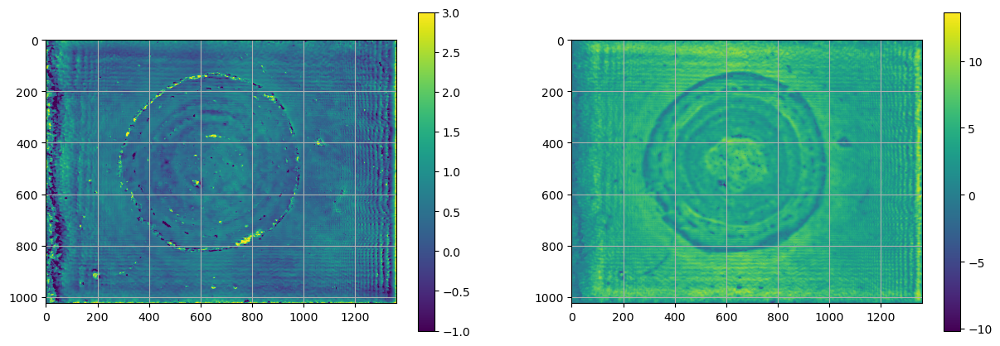

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

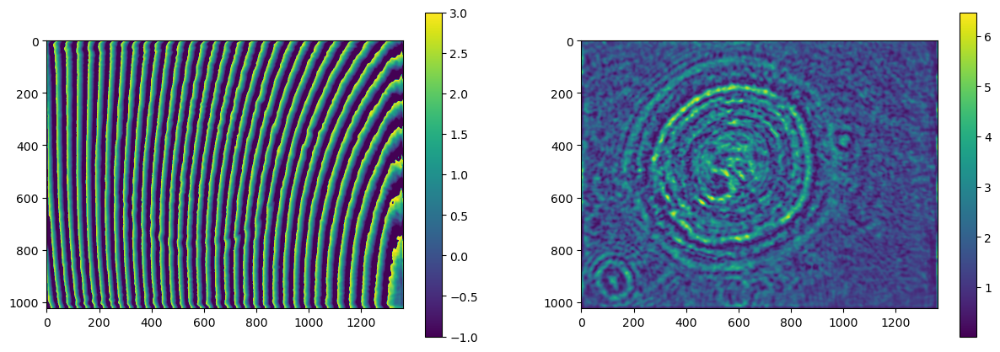

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

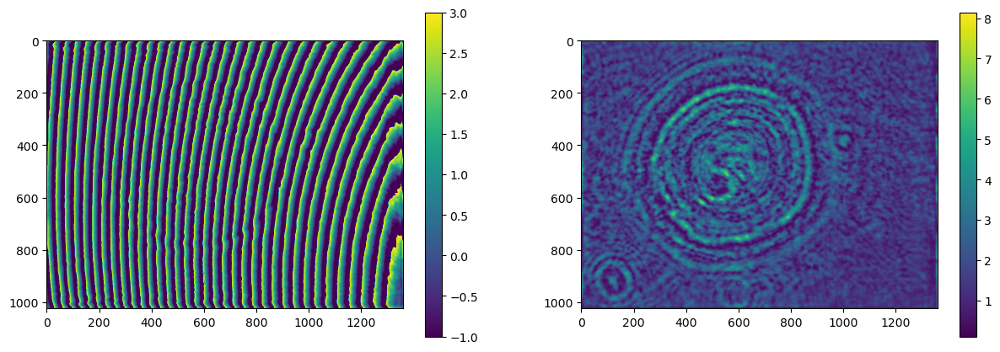

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

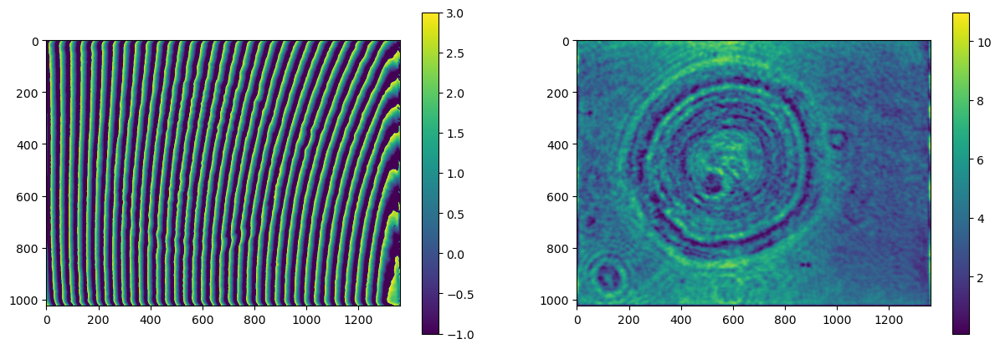

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

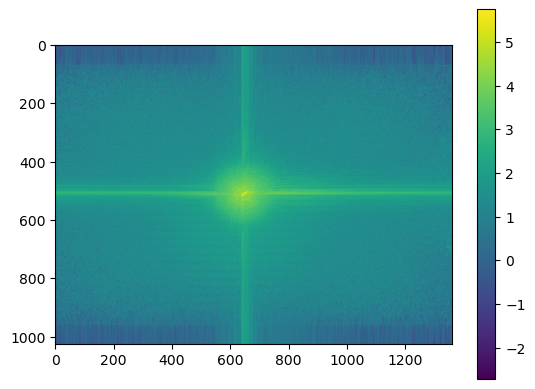

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

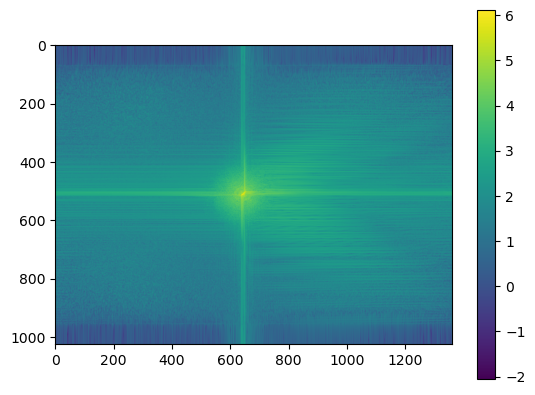

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

tensor([[ -12.7241],
        [-114.5435],
        [ -12.9551],
        [   4.7421],
        [   6.8633],
        [-118.1326],
        [   2.3889],
        [   2.4276],
        [   1.5576],
        [   3.9442]], requires_grad=True)

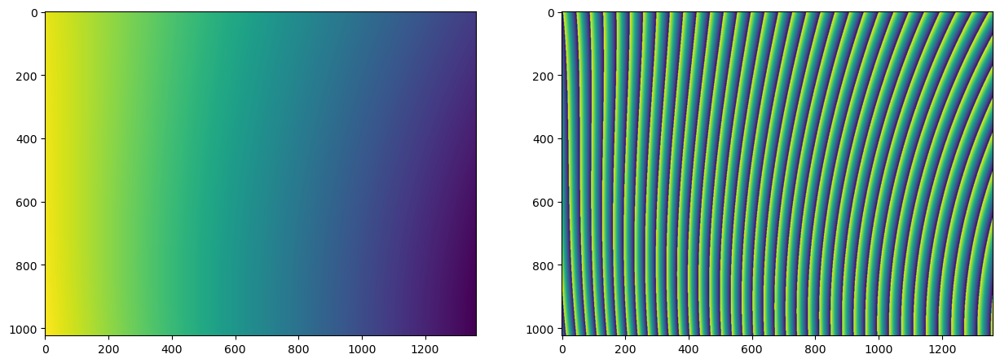

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

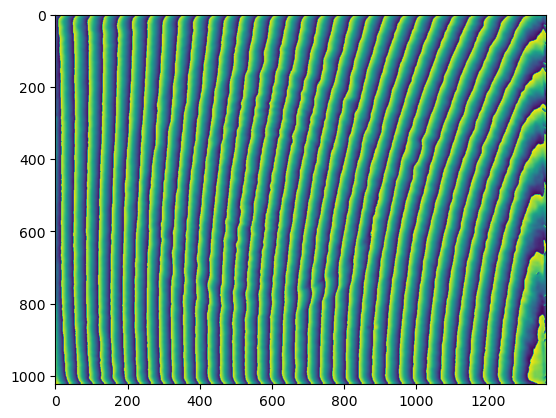

In [ ]:
plt.imshow(wave_z.detach().T)

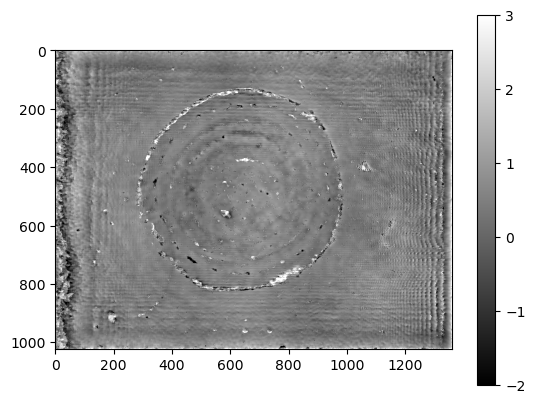

In [ ]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()